In [1]:
include("../../src/CoherentStructures.jl") #this is terrible but neccessary during development (?)

Main.CoherentStructures

In [2]:
normalizeUL2(u,M) = u.*sign.(sum(u))./ sqrt(u'*M*u);

In [3]:
using StreamMacros, Main.CoherentStructures
using Tensors, Arpack 
using Plots
using OrdinaryDiffEq

In [4]:
# Parameters
grid_resolution        = 100
quadrature_order       = 5
nev                    = 10        # which Eigenvector to choose
ϵ                      = 0.2       # perturbation
t₀                      = 0.6      # parameter value corresponding to ϵ=0
solver_tolerance       = 1e-9
solver                 = OrdinaryDiffEq.BS5();

In [5]:
rot_double_gyre = @velo_from_stream Ψ_rot_dgyre begin
    st          = heaviside(t)*heaviside(1-t)*t^2*(3-2*t) + heaviside(t-1)
    heaviside(x)= 0.5*(sign(x) + 1)
    Ψ_P         = sin(2π*x)*sin(π*y)
    Ψ_F         = sin(π*x)*sin(2π*y)
    Ψ_rot_dgyre = (1-st) * Ψ_P + st * Ψ_F
end
T(x,p) = flow(rot_double_gyre, x, [0.0, t₀ + p],
    tolerance = solver_tolerance, solver = solver)[end];

In [6]:
T_inv(x,p) = flow(rot_double_gyre, x, [t₀ + p, 0.0],     
    tolerance = solver_tolerance, solver = solver)[end]

T_inv (generic function with 1 method)

In [7]:
LL, UR = (0.0, 0.0), (1.0, 1.0)
ctx, _ = regularTriangularGrid((grid_resolution, grid_resolution), LL, UR, quadrature_order = quadrature_order);

In [8]:
M = assembleMassMatrix(ctx);

In [9]:
@time A,_ = nonAdaptiveTOCollocation(ctx, y -> T_inv(y,0),project_in=true);

109.235681 seconds (62.80 M allocations: 4.941 GiB, 1.34% gc time)


In [10]:
@time D⁰ = assembleStiffnessMatrix(ctx)
@time D¹ = A'*D⁰*A
K = 0.5(D⁰+D¹);

  0.693045 seconds (3.32 M allocations: 487.935 MiB, 5.56% gc time)
  0.389146 seconds (235.99 k allocations: 332.994 MiB, 5.23% gc time)


In [11]:
@time Aϵ,_ = nonAdaptiveTOCollocation(ctx, y -> T_inv(y,ϵ),project_in=true);
@time D¹ϵ = Aϵ'*D⁰*Aϵ
Kϵ = 0.5(D⁰+D¹ϵ);

 97.671888 seconds (20.18 M allocations: 2.514 GiB, 0.57% gc time)
  0.329051 seconds (30 allocations: 323.266 MiB, 11.67% gc time)


In [12]:
# assemble the linear response matrix L
@time L = nonadaptiveTOCollocationLinearResponseMatrix(ctx, T, A, 0);

 44.509719 seconds (129.41 M allocations: 12.093 GiB, 2.86% gc time)


In [13]:
# solve the linear system
@time λ₀, u₀ = eigs(K, M, which=:SM, nev=nev)
@assert all(imag.(u₀) .== 0)
@assert all(imag.(λ₀) .== 0)
u₀ = real.(u₀)
λ₀ = real.(λ₀)
for i in 1:size(u₀)[2]
    u₀[:,i] = normalizeUL2(u₀[:,i],M)
end

111.101148 seconds (8.78 M allocations: 7.246 GiB, 0.76% gc time)


In [14]:
# calculate the exact uϵ
λϵ, uϵ = eigs(Kϵ, M, which=:SM, nev=nev)
@assert all(imag.(uϵ) .== 0)
@assert all(imag.(λϵ) .== 0)
uϵ = real.(uϵ)
λϵ = real.(λϵ)
for i in 1:size(uϵ)[2]
    uϵ[:,i] = normalizeUL2(uϵ[:,i],M)
end

In [15]:
# solve the system for the derivative u_dot
u_dot = zero(u₀)
λ_dot = zero(λ₀)
for i in 1:size(u₀)[2] 
    @time u_dot[:,i], λ_dot[i] = getLinearResponse(u₀[:,i],λ₀[i],M,K,L)
end

 41.520989 seconds (4.25 M allocations: 6.619 GiB, 1.13% gc time)
 38.730891 seconds (305 allocations: 6.417 GiB, 0.77% gc time)
 39.076480 seconds (305 allocations: 6.417 GiB, 1.28% gc time)
 38.763107 seconds (305 allocations: 6.309 GiB, 0.67% gc time)
 38.851711 seconds (305 allocations: 6.417 GiB, 0.72% gc time)
 39.929524 seconds (305 allocations: 6.417 GiB, 0.71% gc time)
 41.357893 seconds (305 allocations: 6.417 GiB, 1.64% gc time)
 41.058091 seconds (305 allocations: 6.417 GiB, 1.59% gc time)
 39.513414 seconds (305 allocations: 6.417 GiB, 1.68% gc time)
 39.275144 seconds (305 allocations: 6.417 GiB, 1.63% gc time)


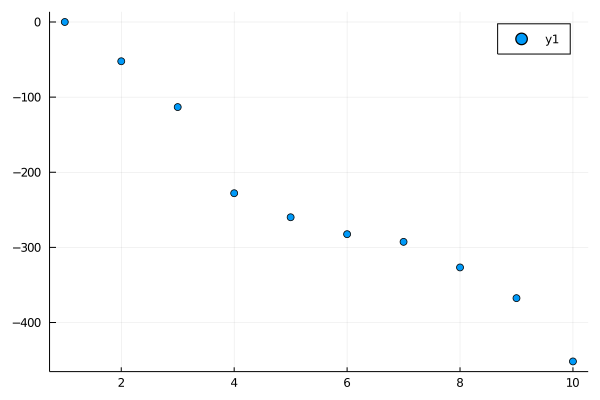

In [16]:
#select number of evs
Plots.scatter(1:nev,λ₀)

In [17]:
nev = 3
u₀ = u₀[:,1:nev]
λ₀ = λ₀[1:nev]
uϵ = uϵ[:,1:nev]
λϵ = λϵ[1:nev]
u_dot = u_dot[:,1:nev]
λ_dot = λ_dot[1:nev];

In [18]:
for i in 1:nev
    print("exact ev"*string(i)*": "*string(λϵ[i])*
        "\t predicted ev"*string(i)*": "*string(λ₀[i] + ϵ*λ_dot[i])*
        "\t relative error: "*string(abs(λ₀[i] + ϵ*λ_dot[i] - λϵ[i])/abs(λϵ[i]))*"\n")
end

exact ev1: -1.1554453315735304e-12	 predicted ev1: -5.352861517080122e-12	 relative error: 3.632725902999137
exact ev2: -64.9691105277654	 predicted ev2: -20.79990115911633	 relative error: 0.6798493778019753
exact ev3: -123.92312173513177	 predicted ev3: -116.19026577894145	 relative error: 0.0624004289749754


In [19]:
color =    :balance
xticks =   0:1:1
yticks =   0:1:1
colorbar = :left
cmins =     [-2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5]
cmaxs =     -cmins
cmins_lr =  [-2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5]
cmaxs_lr =  -cmins_lr;

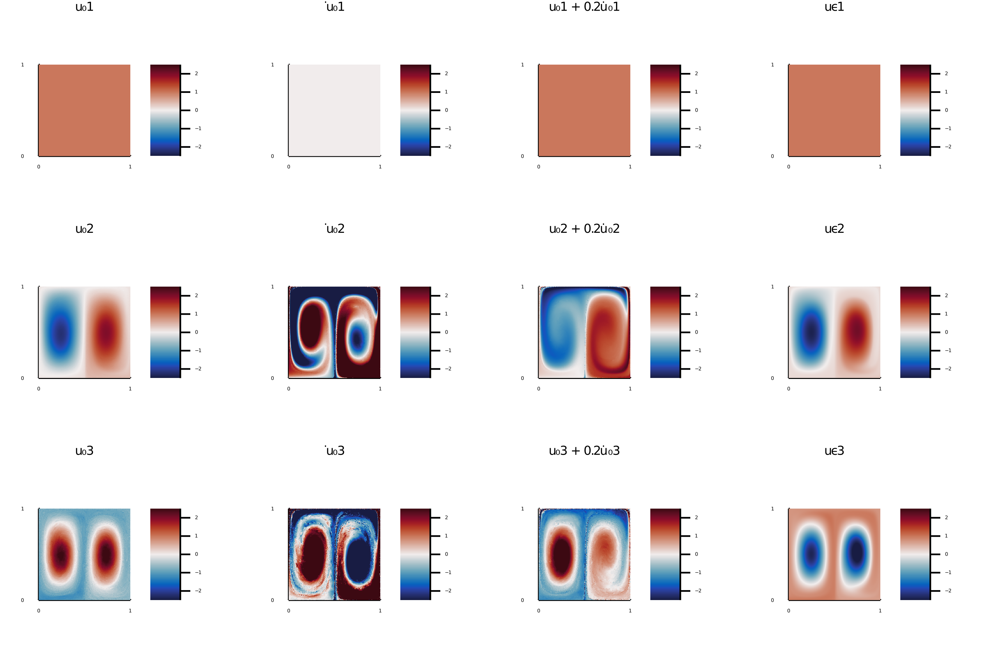

In [20]:
plots = []
for i in 1:nev
    push!(plots,plot_u(ctx, u₀[:,i],  grid_resolution, grid_resolution, 
            title="u₀"*string(i), 
                colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, u_dot[:,i],  grid_resolution, grid_resolution, 
            title="̇u₀"*string(i), 
        colorbar=colorbar, color=color, clims=(cmins_lr[i],cmaxs_lr[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, u₀[:,i] + ϵ*u_dot[:,i],  grid_resolution, grid_resolution, 
            title="u₀"*string(i)*" + $(ϵ)u̇ ₀"*string(i), 
    colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, uϵ[:,i],  grid_resolution, grid_resolution, 
            title="uϵ"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
end
Plots.plot(plots..., fmt=:png, dpi=500,layout=grid(nev,4),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

In [21]:
#limit ourselves to one ev for plotting etc.
ev = 2

2

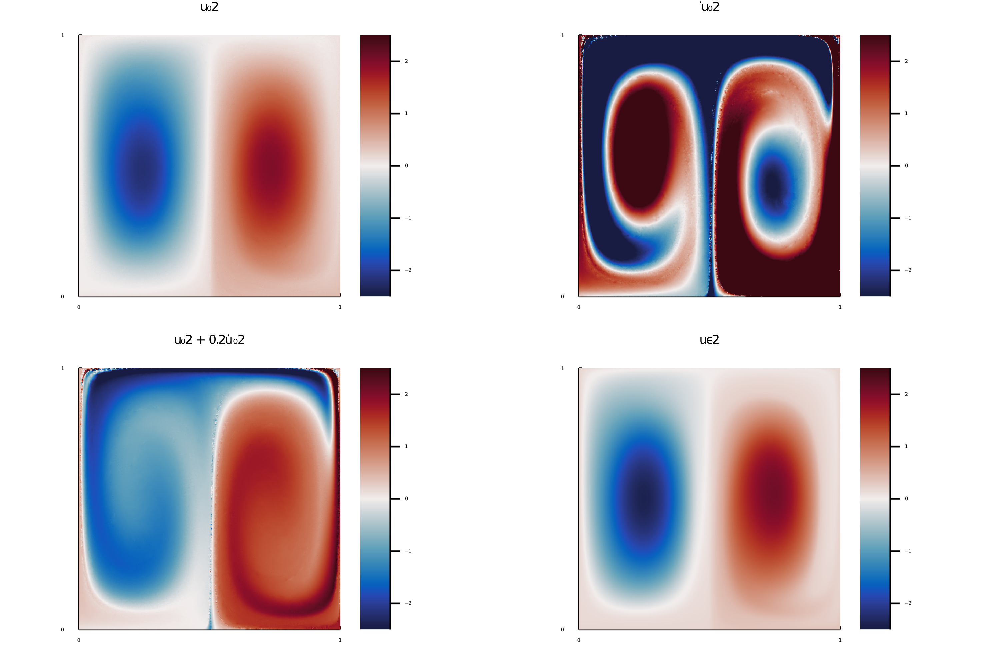

In [22]:
plots = []
push!(plots,plot_u(ctx, u₀[:,ev],  grid_resolution, grid_resolution, 
        title="u₀"*string(ev), 
            colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, u_dot[:,ev],  grid_resolution, grid_resolution, 
        title="̇u₀"*string(ev), 
    colorbar=colorbar, color=color, clims=(cmins_lr[ev],cmaxs_lr[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, u₀[:,ev] + ϵ*u_dot[:,ev],  grid_resolution, grid_resolution, 
        title="u₀"*string(ev)*" + $(ϵ)u̇ ₀"*string(ev), 
colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, uϵ[:,ev],  grid_resolution, grid_resolution, 
        title="uϵ"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
Plots.plot(plots..., fmt=:png, dpi=500,layout=grid(2,2),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

## Contour Plots

In [23]:
using Contour

In [24]:
import Main.CoherentStructures:dynamic_cheeger_value
dynamic_cheeger_value(c) = dynamic_cheeger_value(ctx,c,x->T(x,0);tolerance=1e-10)

dynamic_cheeger_value (generic function with 2 methods)

In [25]:
# Just here to compare with the matlab function

function isClosed(curve)
   return Main.CoherentStructures.closeCurve(ctx,curve,tolerance=1e-10) == curve
end

function dynamic_cheeger_value_matlab(curve)
    image_curve   = Main.CoherentStructures.apply2curve(x->T(x,ϵ),curve)
    
    if !isClosed(curve) || !isClosed(image_curve)
        return Inf
    end
    
    return 0.5(Main.CoherentStructures.getLength(curve)/Main.CoherentStructures.getEuclideanArea(ctx,curve,tolerance=1e-10) +
        Main.CoherentStructures.getLength(image_curve)/Main.CoherentStructures.getEuclideanArea(ctx,image_curve,tolerance=1e-10))
end

dynamic_cheeger_value_matlab (generic function with 1 method)

In [26]:
# resoultion for the levelset methods (default should be 'nothing', that way the grid resolution is used)
x_resolution = 500
y_resolution = 500;

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.2137903905964373)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.2095575519212503)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.2053247132460627)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.2010918745708756)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.196859035895688)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.1926261972205006)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.1883933585453135)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.184160519870126)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -2.179927681194939)
└ @ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8878618126070108)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8836289739318235)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8793961352566362)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8751632965814486)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8709304579062613)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.866697619231074)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8624647805558867)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8582319418806994)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.8539991032055119)
└ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5746317506431462)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5703989119679589)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5661660732927716)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.561933234617584)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5577003959423967)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5534675572672094)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.549234718592022)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5450018799168346)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5407690412416473)
└ @

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2529360113289068)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2487031726537194)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2444703339785321)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2402374953033448)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2360046566281575)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.23177181795297)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2275389792777827)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.2233061406025953)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.219073301927408)
└ @ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9439387880402296)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9397059493650423)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9354731106898548)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9312402720146675)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9270074333394801)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9227745946642928)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9185417559891055)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9143089173139181)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.9100760786387307)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.630708726076365)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6264758874011777)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6222430487259902)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6180102100508029)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6137773713756155)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6095445327004282)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6053116940252408)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6010788553500535)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5968460166748661)
└ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.32171150278768773)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.31747866411250036)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.313245825437313)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.30901298676212563)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.30478014808693826)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.3005473094117509)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2963144707365636)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2920816320613762)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2878487933861888

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.008481440823823096)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.004248602148635737)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.5763473448377624e-5)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.004217075201738982)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.008449913876926342)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.012682752552113702)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.01691559122730106)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.02114842990248842)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.0253812685

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.30051578246485416)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.30474862114004153)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3089814598152289)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.31321429849041627)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3174471371656036)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.32167997584079094)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3259128145159783)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3301456531911657)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.33437849186635304)
└ @ M

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6137458444287188)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6179786831039061)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6222115217790936)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6264443604542809)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6306771991294682)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6349100378046556)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6391428764798429)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6433757151550303)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6476085538302176)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9269759063925834)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9312087450677707)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9354415837429582)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9396744224181455)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9439072610933329)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9481400997685202)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9523729384437075)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9566057771188949)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9608386157940823)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.240205968356448)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2444388070316355)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2486716457068228)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.25290448438201)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2571373230571974)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.261370161732385)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2656030004075722)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2698358390827595)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2740686777579469)
└ @ Main In[27

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5576688689955)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5619017076706874)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5661345463458747)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.570367385021062)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5746002236962495)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5788330623714368)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5830659010466241)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5872987397218115)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5915315783969988)
└ @ Main In[27

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8793646083097393)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8835974469849266)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8878302856601141)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8920631243353014)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8962959630104887)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.900528801685676)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9047616403608636)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.908994479036051)
└ @ Main In[27]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9132273177112382)
└ @ Main In[

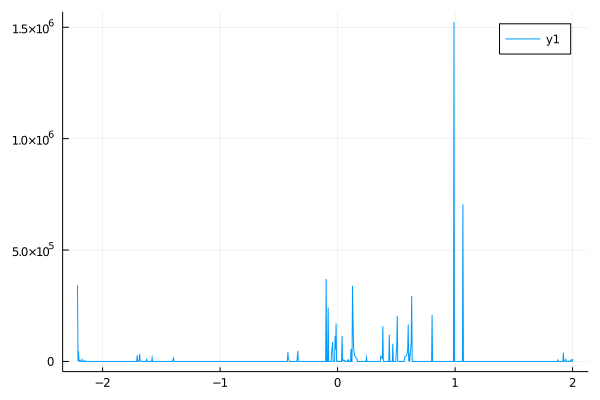

In [27]:
minU = minimum(u₀[:,ev])
maxU = maximum(u₀[:,ev])
values = []
for c in range(minU,stop=maxU,length=1000)
    levelset = Main.CoherentStructures.get_levelset(ctx,u₀[:,ev],c,x_resolution=x_resolution,y_resolution=y_resolution)
    curves = lines(levelset)
    if (length(curves)>0)
        if length(curves) != 1
            @warn "Currently only connected levelsets are allowed! Levelset: ", level(levelset)
        end
        push!(values,dynamic_cheeger_value(curves[1]))
    else 
        push!(values,0)
    end
end
Plots.plot(range(minU,stop=maxU,length=1000)[2:end-1],values[2:end-1])
Plots.plot!(fmt=:png,dpi=100)

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -1.0)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.997997997997998)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.995995995995996)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.993993993993994)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.991991991991992)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.98998998998999)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.987987987987988)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.985985985985986)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.983983983983984)
└ @ Main In[28]:9
┌ Warni

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8538538538538538)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8518518518518519)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8498498498498499)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8478478478478478)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8458458458458459)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8438438438438438)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8418418418418419)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8398398398398398)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.8378378378378378)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.7037037037037037)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.7017017017017017)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6996996996996997)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6976976976976977)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6956956956956957)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6936936936936937)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6916916916916916)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6896896896896897)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.6876876876876877)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5575575575575575)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5555555555555556)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5535535535535535)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5515515515515516)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5495495495495496)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5475475475475475)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5455455455455456)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5435435435435435)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.5415415415415415)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.4114114114114114)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.4094094094094094)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.4074074074074074)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.40540540540540543)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.4034034034034034)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.4014014014014014)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.3993993993993994)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.3973973973973974)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.3953953953953954)


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2652652652652653)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.26326326326326327)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.26126126126126126)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.25925925925925924)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.25725725725725723)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2552552552552553)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.25325325325325326)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.25125125125125125)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.2492492492492

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.12112112112112113)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.11911911911911911)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.11711711711711711)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.11511511511511512)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.11311311311311312)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.1111111111111111)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.1091091091091091)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.10710710710710711)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", -0.1051051051051

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.023023023023023025)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.025025025025025027)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.02702702702702703)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.02902902902902903)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.031031031031031032)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.03303303303303303)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.035035035035035036)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.037037037037037035)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.039039039039039

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17117117117117117)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17317317317317318)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17517517517517517)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17717717717717718)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17917917917917917)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.18118118118118118)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.1831831831831832)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.18518518518518517)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.1871871871871872)
└ @

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3173173173173173)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.31931931931931934)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3213213213213213)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3233233233233233)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3253253253253253)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.32732732732732733)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.32932932932932935)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.33133133133133136)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3333333333333333)
└ @ Ma

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.46346346346346345)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.46546546546546547)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4674674674674675)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4694694694694695)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.47147147147147145)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.47347347347347346)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4754754754754755)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4774774774774775)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4794794794794795)
└ @ Ma

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6116116116116116)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6136136136136137)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6156156156156156)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6176176176176176)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6196196196196196)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6216216216216216)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6236236236236237)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6256256256256256)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6276276276276276)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7597597597597597)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7617617617617618)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7637637637637638)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7657657657657657)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7677677677677678)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7697697697697697)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7717717717717718)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7737737737737738)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7757757757757757)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9079079079079079)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9099099099099099)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9119119119119119)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.913913913913914)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9159159159159159)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9179179179179179)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.91991991991992)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9219219219219219)
└ @ Main In[28]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.923923923923924)
└ @ Main In[28

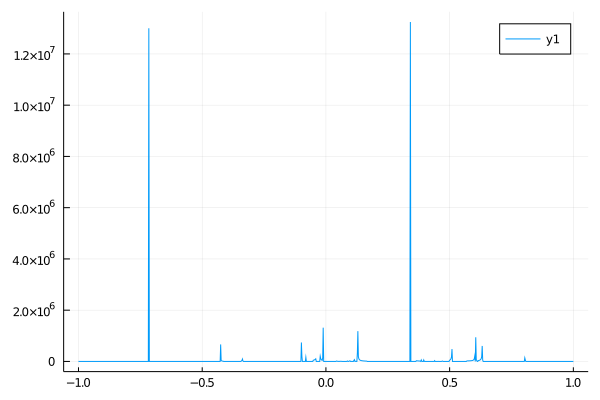

In [28]:
minU = -1
maxU = 1
values = []
for c in range(minU,stop=maxU,length=1000)
    levelset = Main.CoherentStructures.get_levelset(ctx,u₀[:,ev],c,x_resolution=x_resolution,y_resolution=y_resolution)
    curves = lines(levelset)
    if (length(curves)>0)
        if length(curves) != 1
            @warn "Currently only connected levelsets are allowed! Levelset: ", level(levelset)
        end
        push!(values,dynamic_cheeger_value(curves[1]))
    else 
        push!(values,0)
    end
end
Plots.plot(range(minU,stop=maxU,length=1000)[1:end],values[1:end])
Plots.plot!(fmt=:png,dpi=100)

In [29]:
best_levelset, best_value = get_minimal_levelset(
    ctx,u₀[:,ev],dynamic_cheeger_value,
    x_resolution=x_resolution,y_resolution=y_resolution,
    n_candidates=1000,min=0)
print("Dynamic Cheeger value:\t",best_value,"\n")
print("Levelset:\t\t",level(best_levelset),"\n")

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.0)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.0020125952024429906)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.004025190404885981)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.006037785607328971)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: (

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.06842823688306168)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07044083208550467)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07245342728794765)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07446602249039065)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.1690579970052112)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.1710705922076542)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17308318741009718)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17509578261254016)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.23547363868582988)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2374862338882729)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.23949882909071588)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.24151142429315886)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3018892803664486)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3039018755688916)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.30591447077133455)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.30792706597377756)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3844056836666112)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.38641827886905417)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3884308740714972)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.39044346927394014)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.45082132534722985)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.45283392054967286)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4548465157521159)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.45685911095455883)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5172369670278486)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5192495622302915)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5212621574327345)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5232747526351775)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6057911559353402)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6078037511377832)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6098163463402261)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6118289415426691)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6722067976159588)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6742193928184018)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6762319880208448)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6782445832232878)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7386224392965776)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7406350344990205)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7426476297014635)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7446602249039065)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8050380809771962)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8070506761796392)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8090632713820822)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8110758665845251)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8714537226578148)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8734663178602579)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8754789130627009)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8774915082651439)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9418945547433195)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9439071499457625)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9459197451482055)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9479323403506486)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0083101964239383)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0103227916263813)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0123353868288243)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0143479820312673)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0767384333069998)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0787510285094428)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0807636237118858)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.0827762189143288)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.1451666701900616)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.1471792653925046)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.1491918605949476)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.1512044557973906)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2135949070731233)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2156075022755664)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2176200974780091)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2196326926804522)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.2820231439561849)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.284035739158628)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.286048334361071)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.288060929563514)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warni

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.3504513808392467)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.3524639760416897)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.3544765712441327)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.3564891664465757)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.4188796177223082)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.4208922129247512)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.4229048081271942)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.4249174033296372)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.48730785460537)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.489320449807813)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.491333045010256)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.493345640212699)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5557360914884317)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5577486866908747)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5597612818933175)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.5617738770957605)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.6261769235739363)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.6281895187763793)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.6302021139788223)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.6322147091812653)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.692592565254555)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.694605160456998)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.696617755659441)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.698630350861884)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warnin

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.7630333973400596)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.7650459925425026)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.7670585877449456)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.7690711829473886)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8294490390206783)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8314616342231214)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8334742294255644)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8354868246280074)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8978772759037401)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.8998898711061831)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.901902466308626)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.903915061511069)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warn

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9683181079892447)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9703307031916877)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9723432983941307)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 1.9743558935965737)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

Dynamic Cheeger value:	7.652048004142614
Levelset:		0.010062976012214953


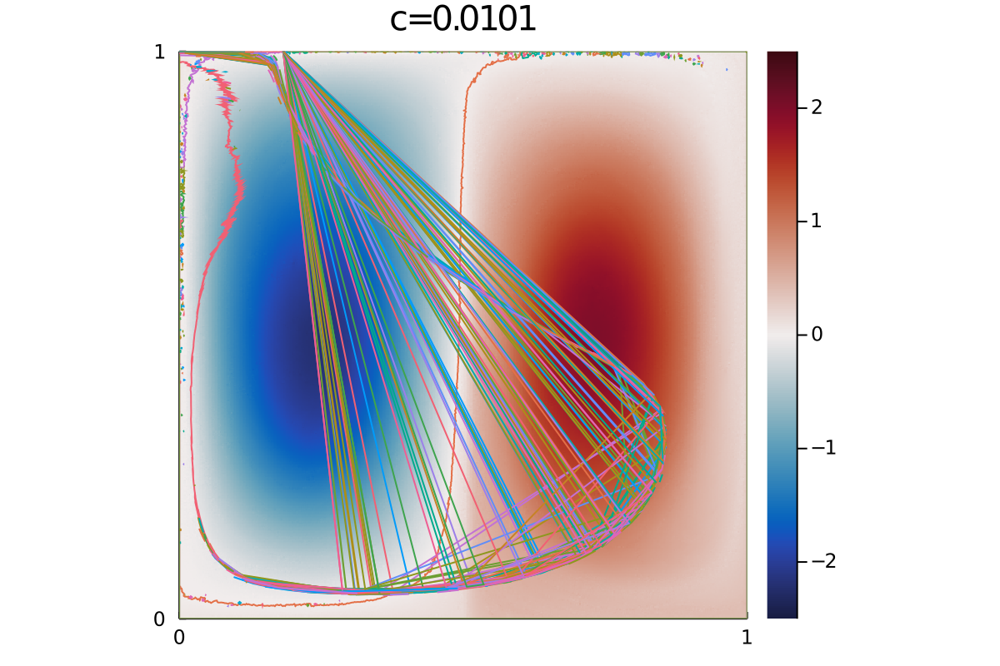

In [30]:
c_best = level(best_levelset)
plot_u(ctx, u₀[:,ev],  grid_resolution, grid_resolution, title="c=$(round(c_best,digits=4))",
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks,legend=false)

curves = lines(best_levelset)
curves = [Main.CoherentStructures.closeCurve(ctx,c) for c in curves]
curves_moved = [Main.CoherentStructures.apply2curve(x->T(x,0),c) for c in curves]

for c in curves
    Plots.plot!(coordinates(c))
end
for c in curves_moved
    Plots.plot!(coordinates(c))
end
Plots.plot!(fmt=:png,dpi=200,legend=false,aspectratio=1,xlims=(0,1),ylims=(0,1))

In [31]:
using PyCall
using PyPlot

In [32]:
function plot_vectorfield(xs,ys,dx,dy,ax;scale=1,step=1)
    xs, ys = xs[1:step:end], ys[1:step:end]
    dx, dy = dx[1:step:end,1:step:end], dy[1:step:end,1:step:end]
    ax.quiver(xs,ys,dx',dy',scale=scale,color="blue")
end

plot_vectorfield (generic function with 1 method)

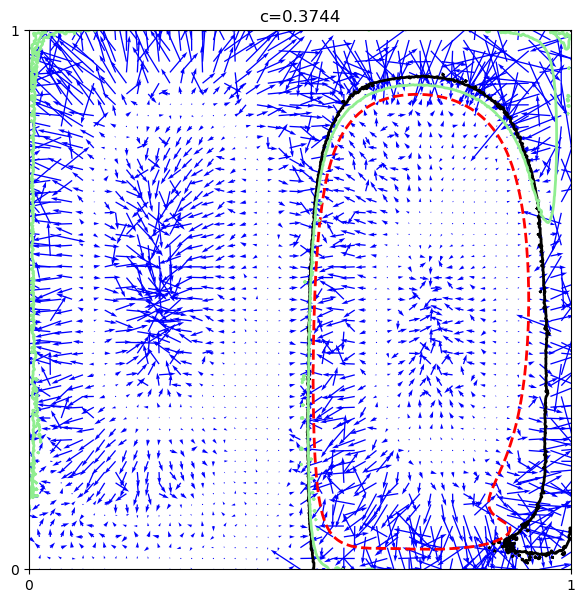

In [60]:
plt.figure(figsize=(7,7), dpi=100)
ax = plt.axes()
ax.set(xlim=(0, 1), ylim=(0, 1), xticks=(0,1), yticks=(0,1))
plot_vectorfield(get_levelset_evolution(ctx,u₀[:,ev],u_dot[:,ev])...,ax,scale=100,step=10)
curves           = lines(get_levelset(ctx, u₀[:,ev],c_best,x_resolution=x_resolution,y_resolution=y_resolution))
curves_epsilon   = lines(get_levelset(ctx, uϵ[:,ev],c_best,x_resolution=x_resolution,y_resolution=y_resolution))
curves_predicted = lines(get_levelset(ctx, u₀[:,ev] + ϵ*u_dot[:,ev],c_best,x_resolution=x_resolution,y_resolution=y_resolution))

for c in curves
    ax.plot(coordinates(c)...,color=:black,linewidth=2)
end
for c in curves_epsilon
    ax.plot(coordinates(c)...,color=:red,linestyle="--",linewidth=2)
end
for c in curves_predicted
    ax.plot(coordinates(c)...,color=:lightgreen,linewidth=2)
end
ax.set_title("c=$(round(c_best,digits=4))");

## SEBA

In [34]:
using LinearAlgebra

In [35]:
# we rescale slightly differently here due to normalizeU instead of normalize
cmins =     [-1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1]
cmaxs =     -cmins
cmins_lr =  [-1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1, -1.1]
cmaxs_lr =  -cmins_lr;

In [36]:
softThreshold(u,μ) = sign.(u) .* max.(abs.(u) .- μ, 0)
normalizeU(u) = u.*sign.(sum(u))/maximum(u*sign.(sum(u)))
normalizeU(u,v) = u.*sign.(sum(v))/maximum(v*sign.(sum(v)));

In [37]:
μ = 0.99/grid_resolution;

In [38]:
@time S, R = SEBA(u₀,μ=μ,returnR=true,sort=false);

  1.836288 seconds (6.30 M allocations: 1.081 GiB, 4.37% gc time)


In [39]:
order = sortperm([-minimum(S[:,i]) for i in 1:nev]);

In [40]:
# This is the matrix we effectively multiply u₀ with
Rot = inv(qr(u₀).R)*R'

3×3 Array{Float64,2}:
 -0.0016166    0.000837567  0.000827761
 -2.77474e-5  -0.00143967   0.00139552
  0.00118314   0.00105576   0.0012209

In [41]:
S_dot = u_dot*Rot;

In [42]:
Sϵ, Rϵ = SEBA(uϵ,μ=μ,returnR=true,sort=false);

In [43]:
S′ = Matrix(qr(u₀).Q)*R';

In [44]:
Sϵ′ = Matrix(qr(uϵ).Q)*Rϵ';

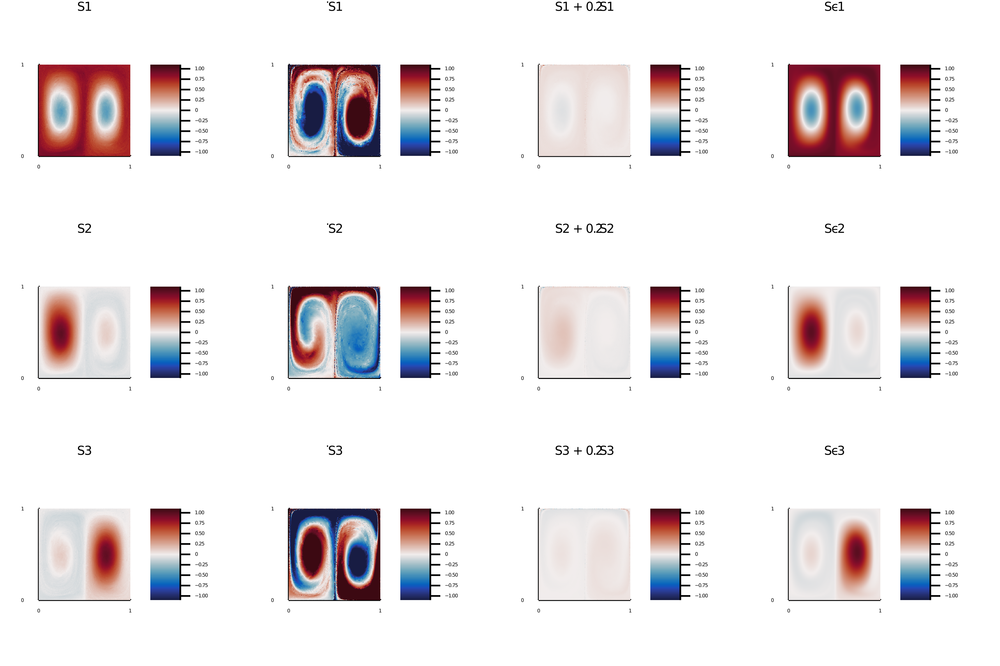

In [45]:
plots = []
for i in 1:nev
    push!(plots,plot_u(ctx, normalizeU(S′[:,i]),  
            grid_resolution, grid_resolution, 
            title="S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, normalizeU(S_dot[:,i],S′[:,i]),  
            grid_resolution, grid_resolution, 
            title="̇S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins_lr[i],cmaxs_lr[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, normalizeU(S′[:,i] + ϵ*S_dot[:,i]),  
            grid_resolution, grid_resolution, 
            title="S"*string(i)*" + $(ϵ)̇S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, normalizeU(Sϵ′[:,i]),  
            grid_resolution, grid_resolution, 
            title="Sϵ"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
end
Plots.plot(plots..., fmt=:png, dpi=500,layout=(nev,4),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

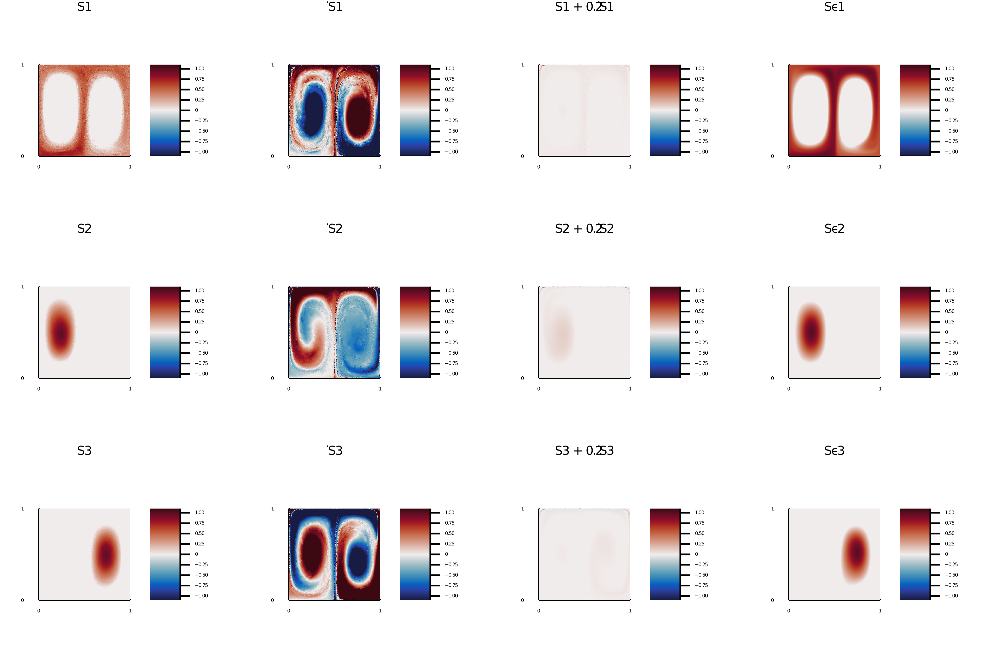

In [46]:
plots = []
for i in 1:nev
    push!(plots,plot_u(ctx, S[:,i],  
            grid_resolution, grid_resolution, 
            title="S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, normalizeU(S_dot[:,i],S′[:,i]),  
            grid_resolution, grid_resolution, 
            title="̇S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins_lr[i],cmaxs_lr[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, normalizeU(softThreshold(S′[:,i] + ϵ*S_dot[:,i],μ)),  
            grid_resolution, grid_resolution, 
            title="S"*string(i)*" + $(ϵ)̇S"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
    push!(plots,plot_u(ctx, Sϵ[:,i],  
            grid_resolution, grid_resolution, 
            title="Sϵ"*string(i), 
            colorbar=colorbar, color=color, clims=(cmins[i],cmaxs[i]), xticks=xticks, yticks=yticks))
end
Plots.plot(plots..., fmt=:png, dpi=500,layout=(nev,4),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

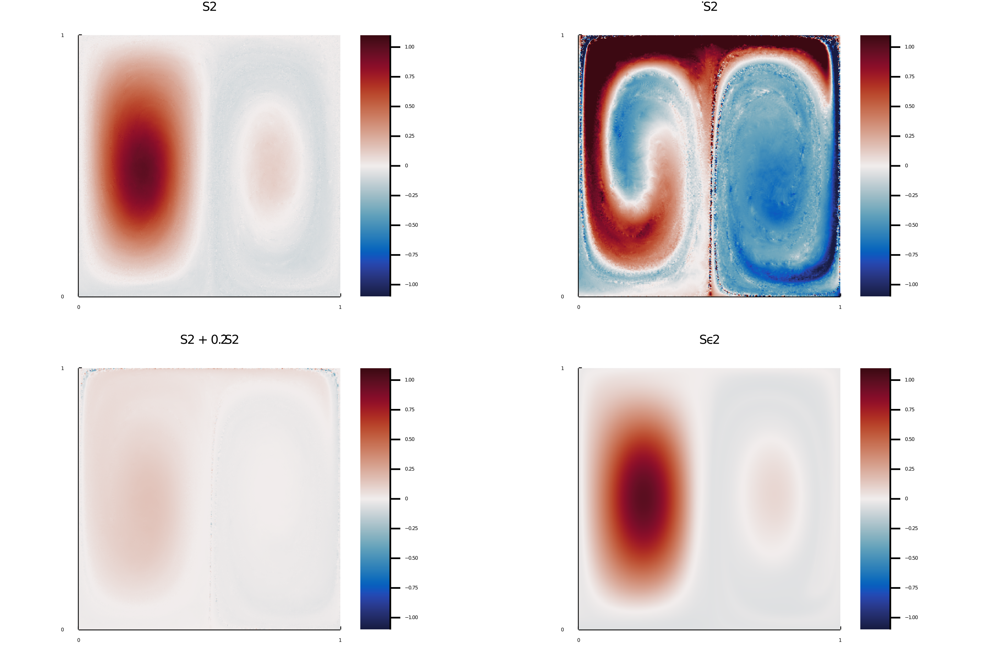

In [47]:
plots = []
push!(plots,plot_u(ctx, normalizeU(S′[:,ev]),  
        grid_resolution, grid_resolution, 
        title="S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, normalizeU(S_dot[:,ev],S′[:,ev]),  
        grid_resolution, grid_resolution, 
        title="̇S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins_lr[ev],cmaxs_lr[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, normalizeU(S′[:,ev] + ϵ*S_dot[:,ev]),  
        grid_resolution, grid_resolution, 
        title="S"*string(ev)*" + $(ϵ)̇S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, normalizeU(Sϵ′[:,ev]),  
        grid_resolution, grid_resolution, 
        title="Sϵ"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
Plots.plot(plots..., fmt=:png, dpi=500,layout=(2,2),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

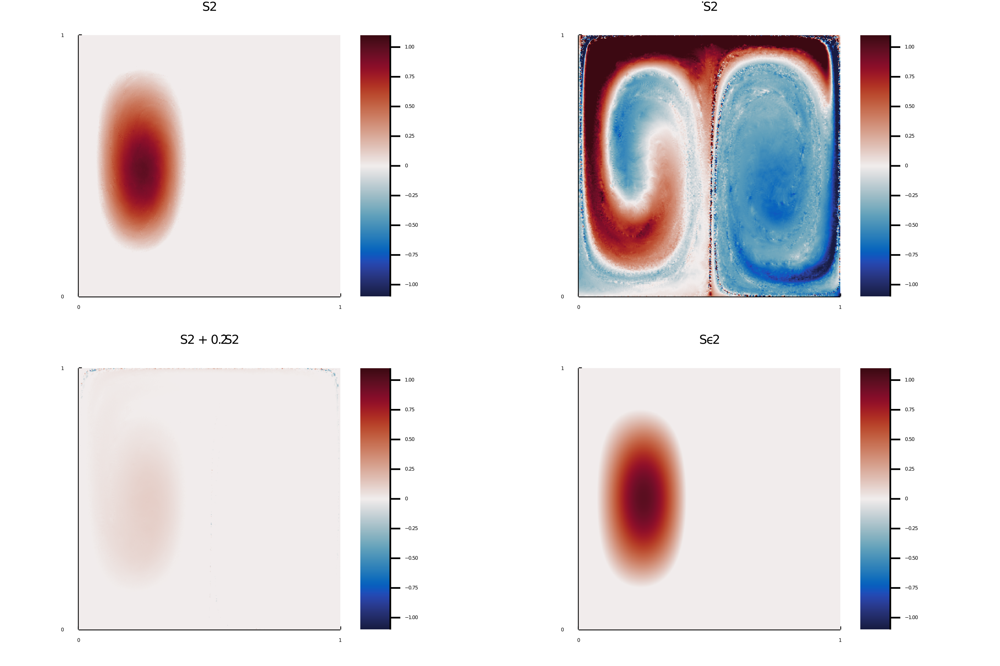

In [48]:
plots = []
push!(plots,plot_u(ctx, S[:,ev],  
        grid_resolution, grid_resolution, 
        title="S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, normalizeU(S_dot[:,ev],S′[:,ev]),  
        grid_resolution, grid_resolution, 
        title="̇S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins_lr[ev],cmaxs_lr[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, normalizeU(softThreshold(S′[:,ev] + ϵ*S_dot[:,ev],μ)),  
        grid_resolution, grid_resolution, 
        title="S"*string(ev)*" + $(ϵ)̇S"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
push!(plots,plot_u(ctx, Sϵ[:,ev],  
        grid_resolution, grid_resolution, 
        title="Sϵ"*string(ev), 
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks))
Plots.plot(plots..., fmt=:png, dpi=500,layout=(2,2),
            xtickfontsize=2,ytickfontsize=2,xguidefontsize=2,yguidefontsize=2,legendfontsize=5,titlefontsize=5)

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.0)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.001001001001001001)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.002002002002002002)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.003003003003003003)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.004004004004004004)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.005005005005005005)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.006006006006006006)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.007007007007007007)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.008008008008008008)
└ @ Main 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07407407407407407)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07507507507507508)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07607607607607608)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07707707707707707)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07807807807807808)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.07907907907907907)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.08008008008008008)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.08108108108108109)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.08208208208208208)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.14714714714714713)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.14814814814814814)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.14914914914914915)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15015015015015015)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15115115115115116)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15215215215215216)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15315315315315314)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15415415415415415)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.15515515515515516)
└

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22022022022022023)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22122122122122123)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2222222222222222)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22322322322322322)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22422422422422422)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22522522522522523)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22622622622622623)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22722722722722724)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.22822822822822822)
└ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2932932932932933)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.29429429429429427)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2952952952952953)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2962962962962963)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2972972972972973)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2982982982982983)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2992992992992993)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3003003003003003)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3013013013013013)
└ @ Main 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3663663663663664)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.36736736736736736)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3683683683683684)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.36936936936936937)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.37037037037037035)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3713713713713714)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.37237237237237236)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3733733733733734)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3743743743743744)
└ @ Ma

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44044044044044045)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44144144144144143)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44244244244244246)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44344344344344344)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4444444444444444)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44544544544544545)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44644644644644643)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44744744744744747)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44844844844844844)
└ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5135135135135135)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5145145145145145)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5155155155155156)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5165165165165165)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5175175175175175)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5185185185185185)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5195195195195195)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5205205205205206)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5215215215215215)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5875875875875876)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5885885885885885)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5895895895895896)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5905905905905906)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5915915915915916)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5925925925925926)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5935935935935935)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5945945945945946)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5955955955955956)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6616616616616616)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6626626626626627)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6636636636636637)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6646646646646647)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6656656656656657)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6666666666666666)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6676676676676677)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6686686686686687)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6696696696696697)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7357357357357357)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7367367367367368)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7377377377377378)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7387387387387387)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7397397397397397)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7407407407407407)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7417417417417418)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7427427427427428)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7437437437437437)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8108108108108109)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8118118118118118)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8128128128128128)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8138138138138138)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8148148148148148)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8158158158158159)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8168168168168168)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8178178178178178)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8188188188188188)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8848848848848849)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8858858858858859)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8868868868868869)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8878878878878879)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8888888888888888)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8898898898898899)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8908908908908909)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8918918918918919)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8928928928928929)
└ @ Main I

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.958958958958959)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.95995995995996)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.960960960960961)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9619619619619619)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9629629629629629)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.963963963963964)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.964964964964965)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.965965965965966)
└ @ Main In[49]:9
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9669669669669669)
└ @ Main In[49]:9

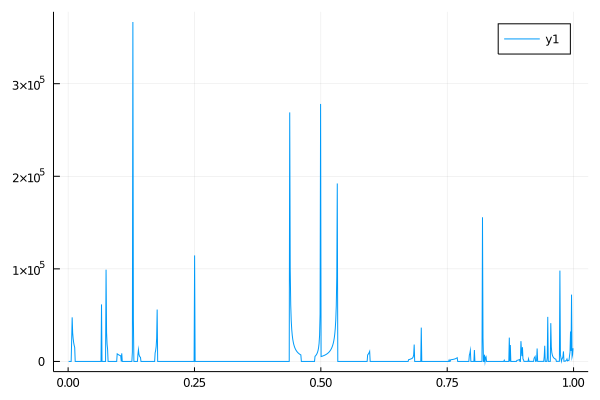

In [49]:
minU = minimum(S[:,ev])
maxU = maximum(S[:,ev])
values = []
for c in range(minU,stop=maxU,length=1000)
    levelset = Main.CoherentStructures.get_levelset(ctx,S[:,ev],c,x_resolution=x_resolution,y_resolution=y_resolution)
    curves = lines(levelset)
    if (length(curves)>0)
        if length(curves) != 1
            @warn "Currently only connected levelsets are allowed! Levelset: ", level(levelset)
        end
        push!(values,dynamic_cheeger_value(curves[1]))
    else 
        push!(values,0)
    end
end
Plots.plot(range(minU,stop=maxU,length=1000)[2:end-1],values[2:end-1])
Plots.plot!(fmt=:png,dpi=100)

In [50]:
best_levelset, best_value = get_minimal_levelset(
    ctx,S[:,ev],dynamic_cheeger_value,
    x_resolution=x_resolution,y_resolution=y_resolution,
    n_candidates=1000,min=0)
print("Dynamic Cheeger value:\t",best_value,"\n")
print("Levelset:\t\t",level(best_levelset),"\n")

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.0)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.001001001001001001)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.002002002002002002)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.003003003003003003)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.03303303303303303)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.03403403403403404)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.035035035035035036)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.036036036036036036)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:15

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.06606606606606606)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.06706706706706707)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.06806806806806807)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.06906906906906907)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.10510510510510511)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.1061061061061061)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.10710710710710711)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.10810810810810811)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.13813813813813813)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.13913913913913914)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.14014014014014015)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.14114114114114115)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17217217217217218)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17317317317317318)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17417417417417416)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.17517517517517517)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.20520520520520522)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2062062062062062)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2072072072072072)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2082082082082082)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ W

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.23823823823823823)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.23923923923923923)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.24024024024024024)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.24124124124124124)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.27127127127127126)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2722722722722723)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.2732732732732733)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.27427427427427425)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.30430430430430433)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3053053053053053)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3063063063063063)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3073073073073073)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ W

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3383383383383383)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.33933933933933935)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.34034034034034033)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.34134134134134136)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3713713713713714)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.37237237237237236)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3733733733733734)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.3743743743743744)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ W

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.40540540540540543)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4064064064064064)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4074074074074074)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4084084084084084)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ W

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.43843843843843844)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4394394394394394)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44044044044044045)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.44144144144144143)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.47147147147147145)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4724724724724725)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.47347347347347346)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.4744744744744745)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ 

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5285285285285285)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5295295295295295)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5305305305305306)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5315315315315315)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5625625625625625)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5635635635635635)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5645645645645646)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5655655655655656)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.5995995995995996)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6006006006006006)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6016016016016016)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6026026026026026)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6336336336336337)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6346346346346347)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6356356356356356)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6366366366366366)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6676676676676677)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6686686686686687)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6696696696696697)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.6706706706706707)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7007007007007007)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7017017017017017)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7027027027027027)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7037037037037037)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7337337337337337)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7347347347347347)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7357357357357357)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7367367367367368)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7727727727727728)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7737737737737738)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7747747747747747)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.7757757757757757)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8068068068068068)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8078078078078078)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8088088088088088)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8098098098098098)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8418418418418419)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8428428428428428)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8438438438438438)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8448448448448449)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8778778778778779)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8788788788788788)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8798798798798799)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.8808808808808809)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Wa

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.914914914914915)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9159159159159159)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9169169169169169)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9179179179179179)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ War

┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9479479479479479)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.948948948948949)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.94994994994995)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.950950950950951)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warnin

Dynamic Cheeger value:	17.892298481333864
Levelset:		0.3743743743743744


┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.9769769769769769)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.977977977977978)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.978978978978979)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warning: ("Currently only connected levelsets are allowed! Levelset: ", 0.97997997997998)
└ @ Main.CoherentStructures C:\Users\Martin\D_Drive\Uni\3 Mathematics in Data Science\05 Masterarbeit\CoherentStructures.jl\src\dynamicIsoperimetry.jl:155
┌ Warnin

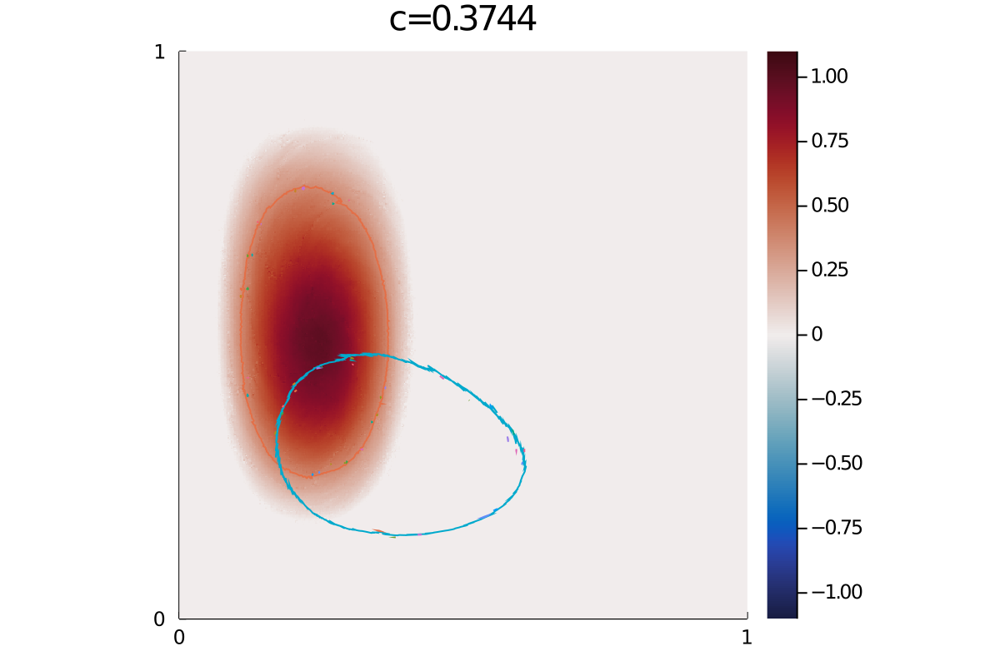

In [51]:
c_best = level(best_levelset)
plot_u(ctx, S[:,ev],  grid_resolution, grid_resolution, title="c=$(round(c_best,digits=4))",
        colorbar=colorbar, color=color, clims=(cmins[ev],cmaxs[ev]), xticks=xticks, yticks=yticks,legend=false)

curves = lines(best_levelset)
curves = [Main.CoherentStructures.closeCurve(ctx,c) for c in curves]
curves_moved = [Main.CoherentStructures.apply2curve(x->T(x,0),c) for c in curves]

for c in curves
    Plots.plot!(coordinates(c))
end
for c in curves_moved
    Plots.plot!(coordinates(c))
end
Plots.plot!(fmt=:png,dpi=200,legend=false,aspectratio=1,xlims=(0,1),ylims=(0,1))

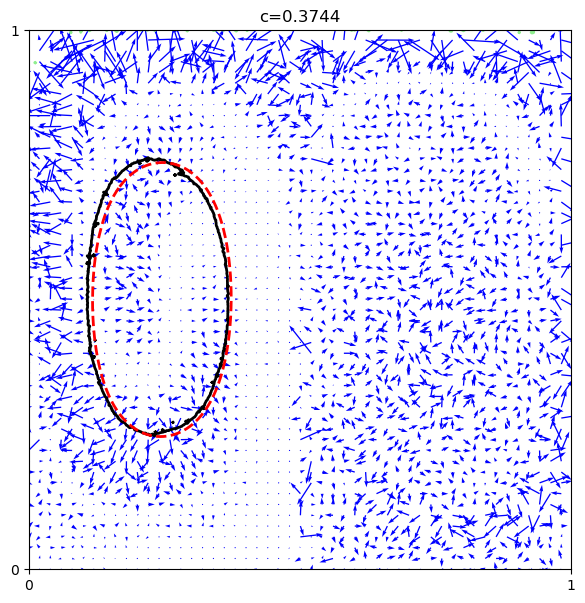

In [63]:
plt.figure(figsize=(7,7), dpi=100)
ax = plt.axes()
ax.set(xlim=(0, 1), ylim=(0, 1), xticks=(0,1), yticks=(0,1))
# this is not completely straightforward due to the nonlinearity of softThreshold!
plot_vectorfield(get_levelset_evolution(ctx,normalizeU(S′[:,ev]),S_dot[:,ev])...,ax,scale=0.2,step=10)
curves           = lines(get_levelset(ctx, S[:,ev],c_best,x_resolution=x_resolution,y_resolution=y_resolution))
curves_epsilon   = lines(get_levelset(ctx, Sϵ[:,ev],c_best,x_resolution=x_resolution,y_resolution=y_resolution))
curves_predicted = lines(get_levelset(ctx, normalizeU(softThreshold(S′[:,ev] + ϵ*S_dot[:,ev],μ)),
                         c_best,x_resolution=x_resolution,y_resolution=y_resolution))

for c in curves
    ax.plot(coordinates(c)...,color=:black,linewidth=2)
end
for c in curves_epsilon
    ax.plot(coordinates(c)...,color=:red,linestyle="--",linewidth=2)
end
for c in curves_predicted
    ax.plot(coordinates(c)...,color=:lightgreen,linewidth=2)
end
ax.set_title("c=$(round(c_best,digits=4))");